In [13]:
from imp import reload
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import glob
import os
from moviepy.editor import VideoFileClip

import visualization
import preprocessing
reload(preprocessing)
reload(visualization)
from visualization import plots
from imp import reload

import config
reload(config)
from config import *
from preprocessing import ReadImg

** Camera Calibration **

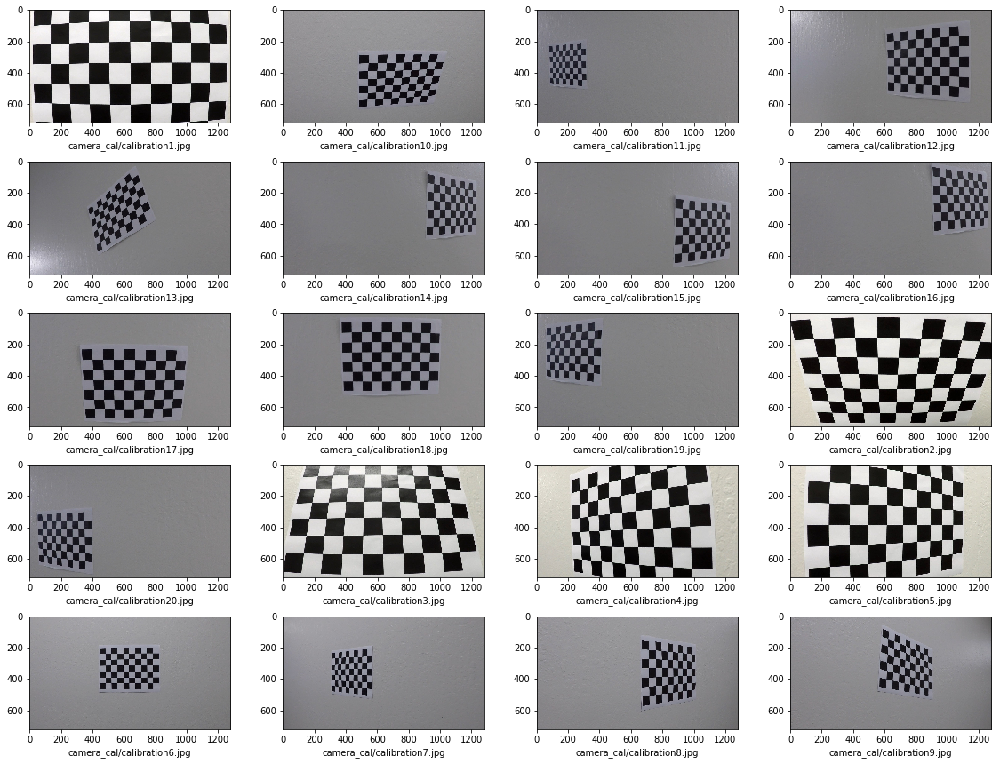

In [14]:
images = glob.glob('camera_cal/calibration*.jpg')
plots([ReadImg(fname) for fname in images], 5, 4, figsize=(16, 12), labels=[fname for fname in images])

In [15]:
import calibration
reload(calibration)
from calibration import Undistort
corner_size = (9, 6)
undistort = Undistort()
undistort.fit(images)
undistort.saveModel()
undistort.saveImages(OUTPUT_DIR)

In [16]:
src = ReadImg(images[15])
dst = undistort.apply(src)

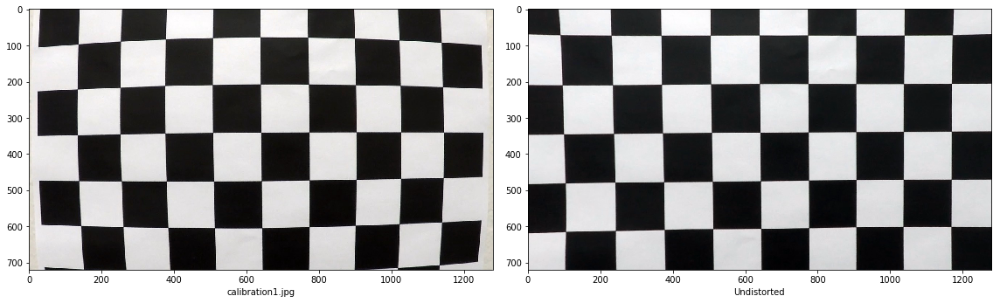

In [17]:
for fname in glob.glob('camera_cal/calibration1.jpg'):
    basename = os.path.basename(fname)
    img = ReadImg(fname)
    dst = undistort.apply(img)
    cv2.imwrite('{}/undistorted-{}'.format(OUTPUT_DIR, basename), dst)
    plots([img, dst], 1, 2, figsize=(16, 12), labels=[basename, 'Undistorted'.format(basename)])

** Perspective transformation & Lane detection **

In [49]:
import preprocessing
import tracker
reload(tracker)
reload(preprocessing)
from preprocessing import *
from tracker import Tracker


dist_pickle = pickle.load(open('calibration_pickle.p', 'rb'))
mtx = dist_pickle['mtx']
dist = dist_pickle['dist']    
ksize=5



curved_centers = Tracker(window_width=WINDOW_WIDTH, window_height=WINDOW_HEIGHT, margin=MARGIN, ym=YM, xm=XM, smooth_factor=15)

def find_lanes(img):
    img_size = (img.shape[0], img.shape[1])
    # Undistort images
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    vertices = np.array([[(580, 450), (760, 450), (1200, 710), (200, 710)]], dtype=np.int32)
    # thresholdings
    preprocessImage = np.zeros_like(img[:, :, 0])
    gradx = abs_sobel_thresh(img, orient='x', thresh=(12, 255))
    grady = abs_sobel_thresh(img, orient='y', thresh=(25, 255))
    c_binary = color_threshold(img, sthreshold=(100, 255), vthreshold=(50, 255))
    preprocessImage[((gradx == 1)&(grady == 1)) | (c_binary == 1)] = 255
    preprocessImage = region_of_interest(preprocessImage, vertices)
    basename = os.path.basename(fname)
    
    cv2.imwrite('{}/tracked-{}'.format(OUTPUT_DIR, basename), preprocessImage)
    
    # perspective
    warped, M, Minv = Warp(preprocessImage)
    window_centroids = curved_centers.find_window_centroid(warped)
    
    plt.figure(figsize=(19, 16))
    
    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)
    
    leftx = []
    rightx = []
    
    # Go through each level and draw the windows
    for level in range(0,len(window_centroids)):
        # Keep track of center of the lanes
        leftx.append(window_centroids[level][0])
        rightx.append(window_centroids[level][1])

        # Window_mask is a function to draw window areas
        l_mask = window_mask(WINDOW_WIDTH,WINDOW_HEIGHT,warped,window_centroids[level][0],level)
        r_mask = window_mask(WINDOW_WIDTH,WINDOW_HEIGHT,warped,window_centroids[level][1],level)
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
        r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255
    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel 
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 0.5, template, 0.5, 0.0) # overlay the orignal road image with window results

    # Fit the lane boundaries to the left / right center 
    yvals = range(0, img.shape[0])   # 720
    res_yvals = np.arange(warped.shape[0]-(WINDOW_HEIGHT/2), 0, -WINDOW_HEIGHT)
        
    left_fit = Polyfit()
    left_fit.fit(res_yvals, leftx)
    left_fitx = left_fit.predict(yvals)
    
    right_fit = Polyfit()
    right_fit.fit(res_yvals, rightx)
    right_fitx = right_fit.predict(yvals)
    
    left_lane = np.array(list(zip(np.concatenate((left_fitx-WINDOW_WIDTH/2, left_fitx[::-1]+WINDOW_WIDTH/2), axis=0), 
            np.concatenate((yvals, yvals[::-1]), axis=0))), np.int32)
    
    right_lane = np.array(list(zip(np.concatenate((right_fitx-WINDOW_WIDTH/2, right_fitx[::-1]+WINDOW_WIDTH/2), axis=0), 
            np.concatenate((yvals, yvals[::-1]), axis=0))), np.int32)
    
    inner_lane = np.array(list(zip(np.concatenate((left_fitx+WINDOW_WIDTH/2, right_fitx[::-1]-WINDOW_WIDTH/2), axis=0), 
            np.concatenate((yvals, yvals[::-1]), axis=0))), np.int32)
    
    middle_marker = np.array(list(zip(np.concatenate((right_fitx-WINDOW_WIDTH/2, right_fitx[::-1]+WINDOW_WIDTH/2), axis=0), 
            np.concatenate((yvals, yvals[::-1]), axis=0))), np.int32)
    
    road = np.zeros_like(img)
    road_blg = np.zeros_like(img)
    
    # map lanes
    cv2.fillPoly(road, [left_lane], color=[255, 0, 0])
    cv2.fillPoly(road, [right_lane], color=[0, 0, 255])
    cv2.fillPoly(road, [inner_lane], color=[0, 255, 0])
    cv2.fillPoly(road_blg, [left_lane], color=[255, 255, 255])
    cv2.fillPoly(road_blg, [right_lane], color=[255, 255, 255])
    
    road_warped = cv2.warpPerspective(road, Minv, (1280, 720), flags=cv2.INTER_LINEAR)
    road_warped_blg = cv2.warpPerspective(road_blg, Minv, (1280, 720), flags=cv2.INTER_LINEAR)
    
    base = cv2.addWeighted(img, 1, road_warped_blg, -1, 0.0)
    result = cv2.addWeighted(base, 1, road_warped, 0.3, 0.0)
    
    # calculate curvature
    curve_fit_cr = np.polyfit(np.array(res_yvals, np.float32)*YM, np.array(leftx, np.float32)*XM, 2)
    curverad = ((1+(2*curve_fit_cr[0]*yvals[-1]*YM + curve_fit_cr[1])**2)**1.5)/np.absolute(2*curve_fit_cr[0])
    
    # calculate the offset of the car to the road
    camera_center = ( left_fitx[-1] + right_fitx[-1] ) / 2 
    center_diff  = (camera_center - warped.shape[1]/2)*XM
    side_pos = 'left'
    
    if center_diff <= 0:
        side_pos = 'right'
    
    cv2.putText(result, 'Radius of curvature = ' + str(round(curverad, 3)) + '(m)', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(result, 'Vehicule is ' + str(abs(round(center_diff, 3))) + 'm ' + side_pos + ' of center' , (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)    
#     plt.figure(figsize=(18, 15))
#     plt.imshow(result)
#     plt.show()        
#     cv2.imwrite('{}/warped-{}'.format(OUTPUT_DIR, basename), warped)
#     cv2.imwrite('{}/lanes-{}'.format(OUTPUT_DIR, basename), output)
#     plots([img, preprocessImage, warped, result], 1, 5, figsize=(18, 15), labels=[basename, 'Filtered'.format(basename), 'warped', 'Detected Lanes'])    
    return result

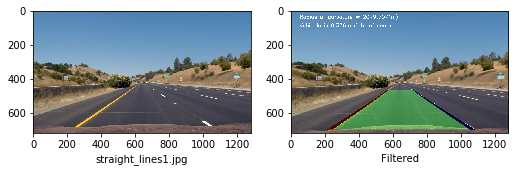

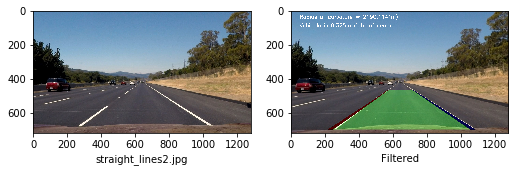

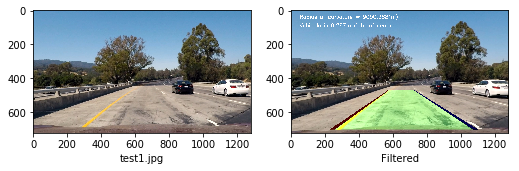

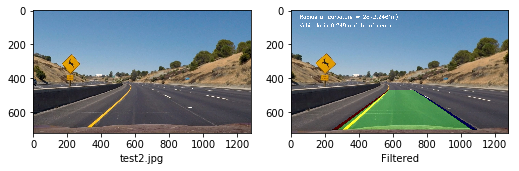

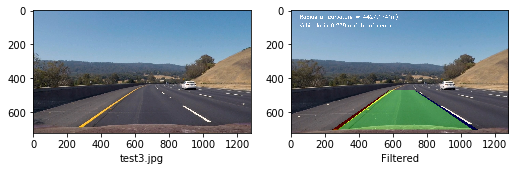

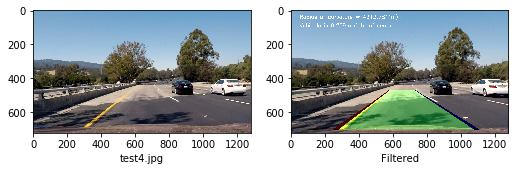

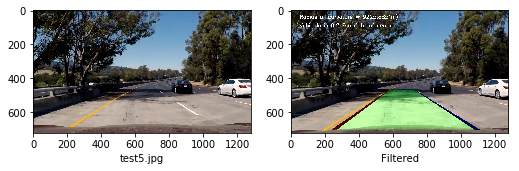

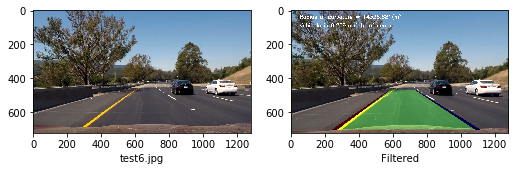

In [19]:
for fname in glob.glob('test_images/*.jpg'):
    img = ReadImg(fname)  
    result = find_lanes(img)
    basename = os.path.basename(fname)
    cv2.imwrite('{}/output-{}'.format(OUTPUT_DIR, basename), cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
    plots([img, result], 1, 5, figsize=(18, 15), labels=[basename, 'Filtered'.format(basename)])

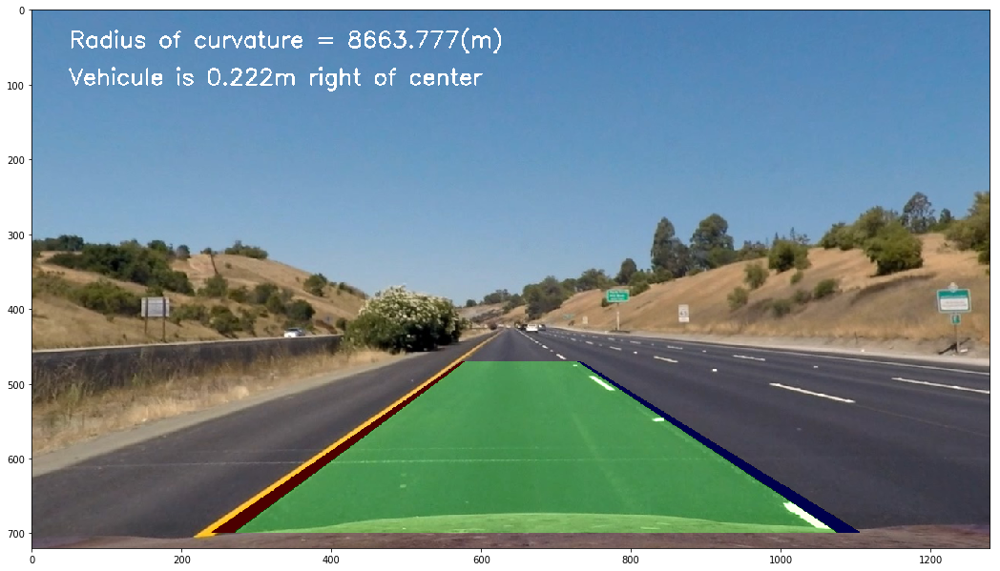

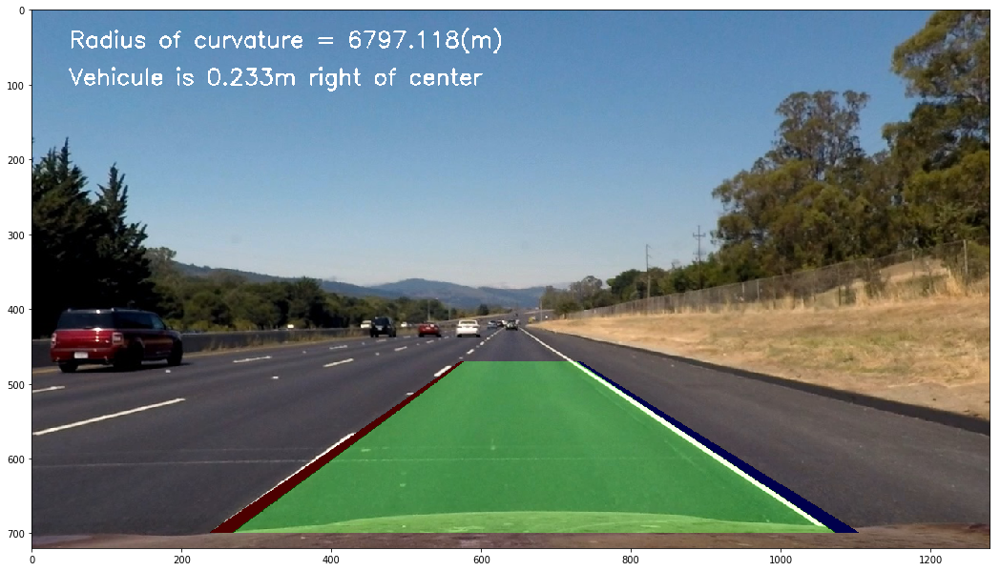

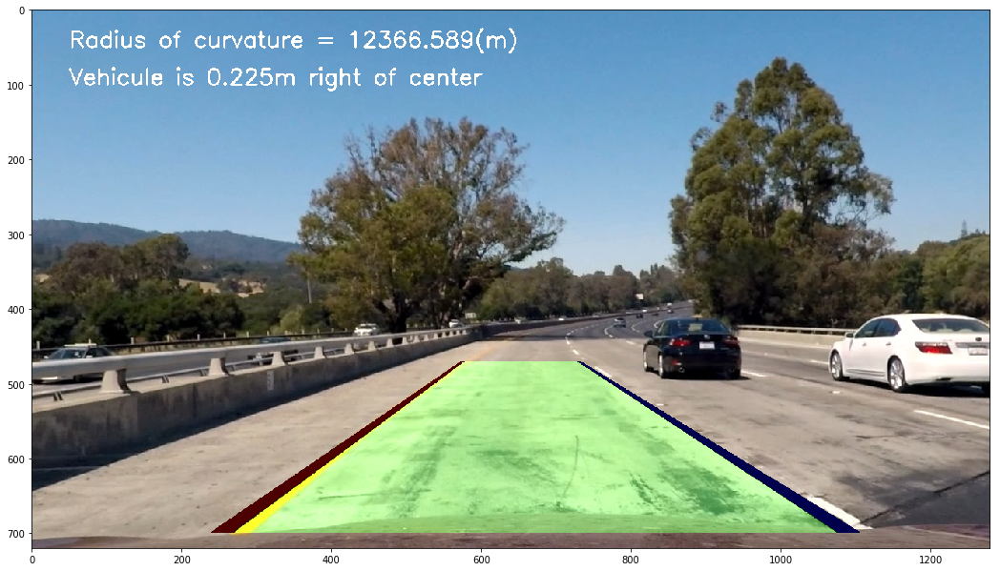

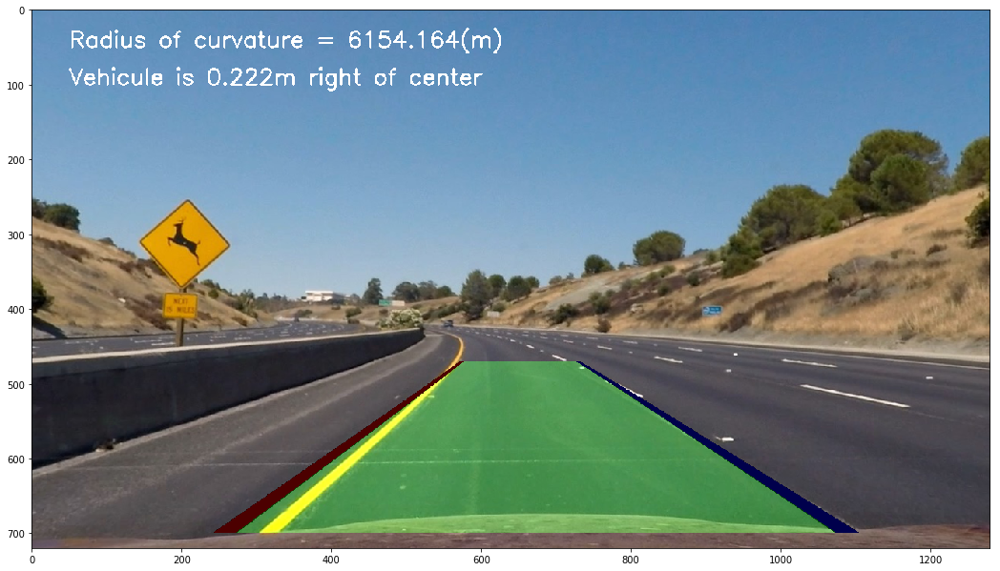

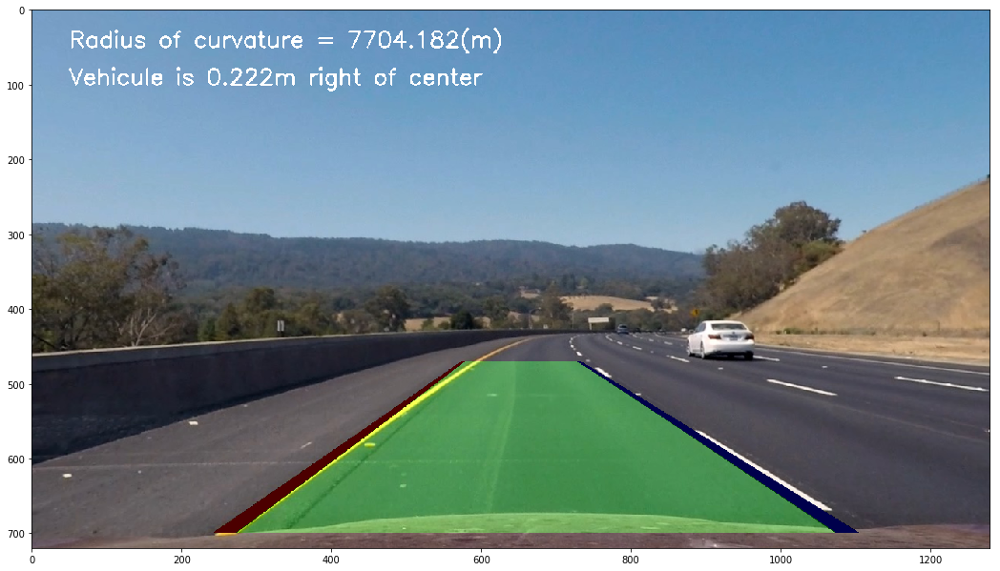

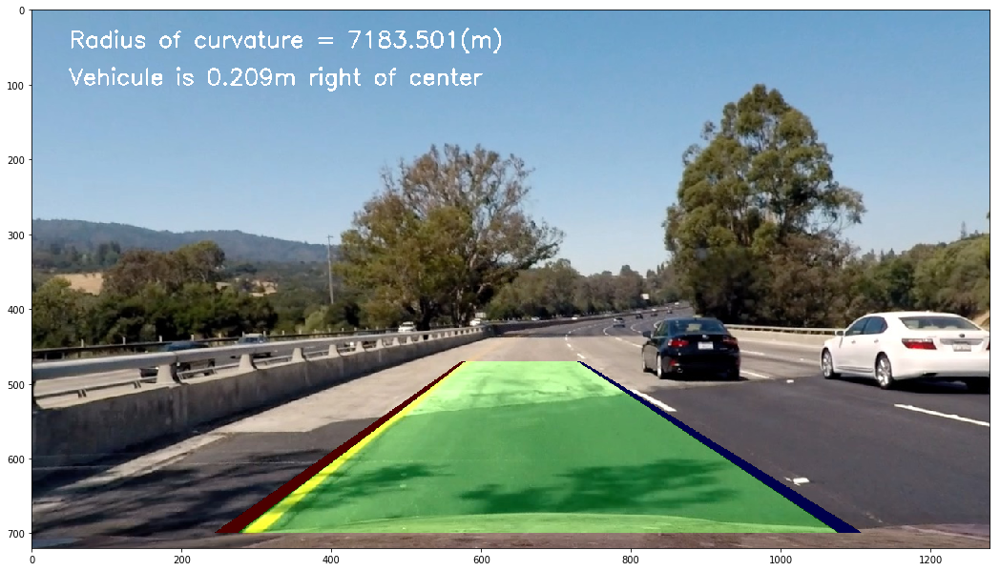

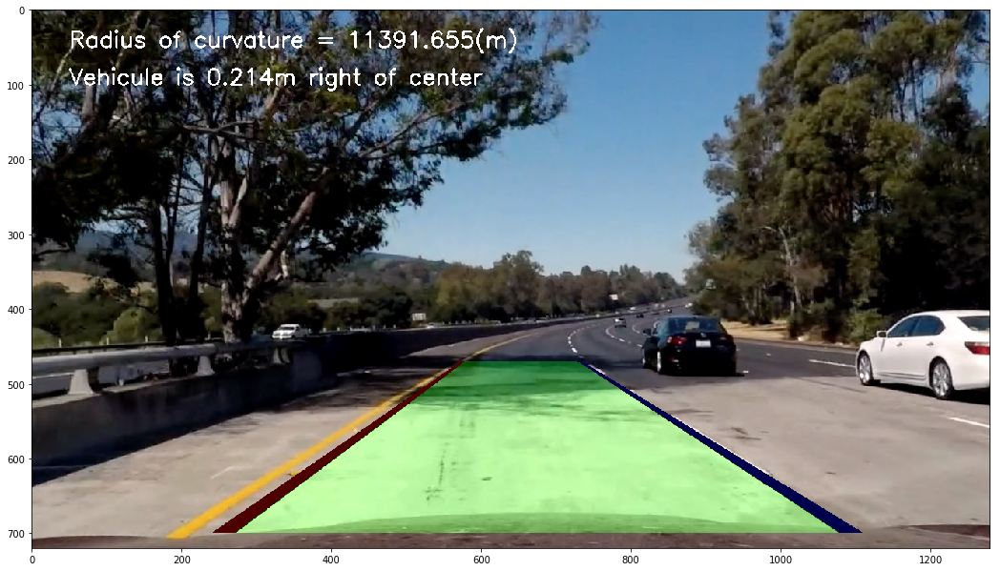

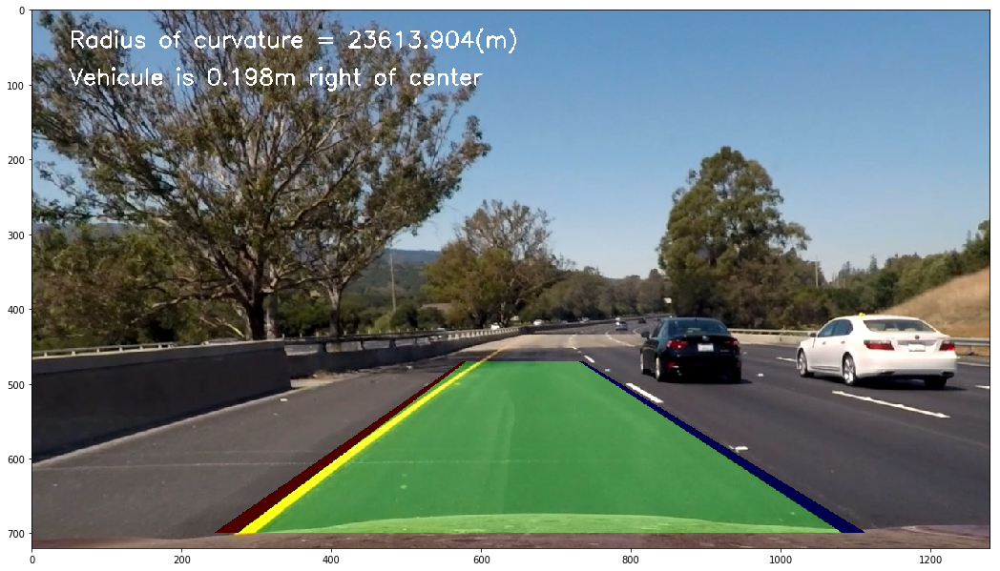

In [20]:
for fname in glob.glob('test_images/*.jpg'):    
        # read images
    img = ReadImg(fname)  
    result = find_lanes(img)
    
    plt.figure(figsize=(18, 15))
    plt.imshow(result)
    plt.show()

In [21]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML


output_video = 'output_video.mp4'
input_video = 'project_video.mp4'

clip1 = VideoFileClip(input_video)
video_clip = clip1.fl_image(find_lanes)
video_clip.write_videofile(output_video, audio=False)

videos = glob.glob('camera_cal/*_video.jpg')

[MoviePy] >>>> Building video output_video.mp4
[MoviePy] Writing video output_video.mp4


100%|█████████▉| 1260/1261 [03:39<00:00,  6.06it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video.mp4 



In [10]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

curved_centers = Tracker(window_width=WINDOW_WIDTH, window_height=WINDOW_HEIGHT, margin=MARGIN, ym=YM, xm=XM, smooth_factor=15)

output_video = 'output_challenge_video.mp4'
input_video = 'challenge_video.mp4'

clip1 = VideoFileClip(input_video)
video_clip = clip1.fl_image(find_lanes)
video_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_challenge_video.mp4
[MoviePy] Writing video output_challenge_video.mp4


100%|██████████| 485/485 [01:23<00:00,  6.00it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_challenge_video.mp4 



In [81]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML


output_video = 'output_harder_challenge_video.mp4'
input_video = 'harder_challenge_video.mp4'

clip1 = VideoFileClip(input_video)
video_clip = clip1.fl_image(find_lanes)
video_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_harder_challenge_video.mp4
[MoviePy] Writing video output_harder_challenge_video.mp4


100%|█████████▉| 1199/1200 [04:07<00:00,  5.36it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_harder_challenge_video.mp4 



** Compute Perspective transform **

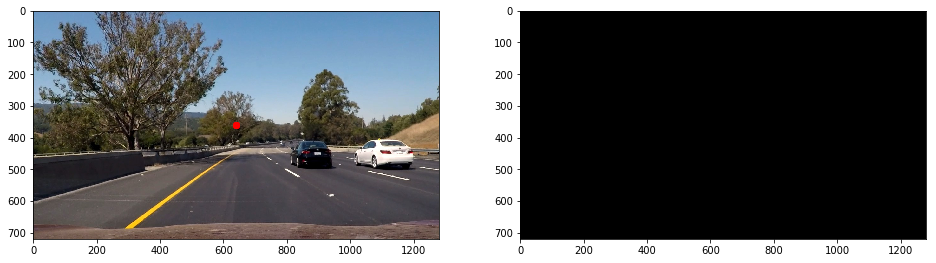

In [24]:
from ipywidgets import widgets
from ipywidgets import interact, interactive, fixed


def Warp(x_src_left_min, y_src_left_min,  x_src_left_max, y_src_left_max, x_src_right_min, y_src_right_min, x_src_right_max, y_src_right_max, offset):
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[x_src_left_min, y_src_left_min], [x_src_left_max, y_src_left_max], [x_src_right_min, y_src_right_min], [x_src_right_max, y_src_right_max]])
#     dst = np.float32([[x_left_min, y_left_min], [x_left_max, y_left_max], [x_right_min, y_right_min], [x_right_max, y_right_max]])
#     dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [offset, img_size[1]], [img_size[0]-offset, img_size[1]]])
    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])

    M = cv2.getPerspectiveTransform(src,dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    plt.figure(figsize=(16, 15))
    plt.subplot(121)
#     plt.scatter([x_left_min, x_left_max, x_right_min, x_right_max], [y_left_min, y_left_max, y_right_min, y_right_max], zorder=999, color='b')
    plt.scatter([x_src_left_min, x_src_left_max, x_src_right_min, x_src_right_max], [y_src_left_min, y_src_left_max, y_src_right_min, y_src_right_max], zorder=999, color='r')
#     cv2.polylines(img, dst, 1, (255, 0, 0))
    plt.imshow(img, zorder=1)
    plt.subplot(122)
    plt.imshow(warped)
    plt.show()


width = img.shape[1]
height = img.shape[0]

# vertices = np.array([[(0,imshape[0]),(460, 320), (490, 320), (imshape[1],imshape[0])]], dtype=np.int32)

interact(Warp,
       x_src_left_min=(0, width, 10), 
       y_src_left_min=(0, height, 10), 
       x_src_left_max=(0, width, 10), 
       y_src_left_max=(0, height, 10), 
       x_src_right_min=(0, width, 10), 
       y_src_right_min=(0, height, 10), 
       x_src_right_max=(0, width, 10), 
       y_src_right_max=(0, height, 10),
       offset = (0, 500, 20)
)

# (290, 680), (510, 510), (850, 510),(1130, 680)

# src = np.float32([[510, 510], [850, 410], [1130, 680], [290, 680]])
# src = np.float32([[580, 470], [780, 470], [1230, 690], [280, 690]])

# src = np.float32([[560, 470], [790, 470], [1150, 700], [260, 700]])
src = np.float32([[590, 470], [750, 470], [1190, 700], [260, 700]])
src = np.float32([[580, 450], [760, 450], [1200, 710], [200, 710]])

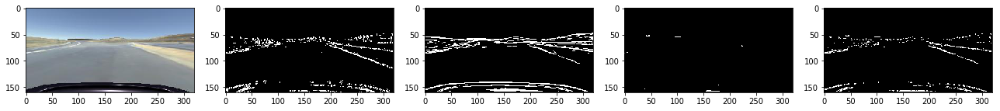

In [34]:
# Undistort images
def pipelines(sobel_x_min=12, sobel_x_max=255, sobel_y_min=25, sobel_y_max=255, s_min=180, s_max=255, v_min=50, v_max=255, ksize=5):
    preprocessImage = np.zeros_like(img[:, :, 0])
    gradx = abs_sobel_thresh(img, orient='x', thresh=(sobel_x_min, sobel_x_max))
    grady = abs_sobel_thresh(img, orient='y', thresh=(sobel_y_min, sobel_y_max))
    c_binary = color_threshold(img, sthreshold=(s_min, s_max), vthreshold=(v_min, v_max))
    preprocessImage[((gradx == 1)&(grady == 1)) | (c_binary == 1) ] = 255
    plots([img, gradx, grady, c_binary, preprocessImage], 1, 5, figsize=(18, 15))

for fname in images:
    img = ReadImg(fname)
    pipelines()

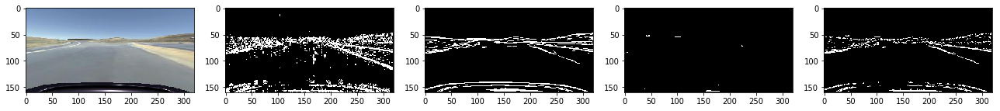

In [33]:
reload(preprocessing)
from preprocessing import *
interact(pipelines, 
         sobel_x_min=(0, 255, 5),
         sobel_x_max=(0, 255, 5),
         sobel_y_min=(0, 255, 5),
         sobel_y_max=(0, 255, 5),
         s_min=(0, 255, 5),
         s_max=(0, 255, 5),
         v_min=(0, 255, 5),
         v_max=(0, 255, 5),
         ksize =(0, 11, 1)
        )

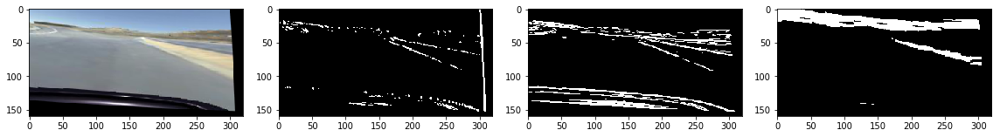

NameError: name 'warped' is not defined

In [61]:
def pipelines(sobel_x_min=12, sobel_x_max=255, sobel_y_min=25, sobel_y_max=255, s_min=180, s_max=255, v_min=50, v_max=255, ksize=5):
    preprocessImage = np.zeros_like(img[:, :, 0])
    gradx = abs_sobel_thresh(img, orient='x', thresh=(sobel_x_min, sobel_x_max))
    grady = abs_sobel_thresh(img, orient='y', thresh=(sobel_y_min, sobel_y_max))
    c_binary = color_threshold(img, sthreshold=(s_min, s_max), vthreshold=(v_min, v_max))
    preprocessImage[((gradx == 1)&(grady == 1)) | (c_binary == 1) ] = 255
    warped, M, Minv = Warp(preprocessImage)
    plots([img, gradx, grady, c_binary, preprocessImage, warped], 1, 6, figsize=(18, 15))


src = np.float32([[100, 75], [0, 120], [200, 75], [320, 120]])
dst = np.float32([[80, 0], [100, 160], [215, 0], [215, 160]])

    
images = [ 
'/Users/nando/Downloads/center_2017_03_07_07_21_22_840.jpg'
]


def Warp(img):
    img_size = (img.shape[1], img.shape[0])
    offset = 260
    src = np.float32([[590, 470], [750, 470], [1190, 700], [260, 700]])
    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warpedImage = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

    return (warpedImage, M, Minv)


def find_lanes(img):
    img_size = (img.shape[0], img.shape[1])
    # Undistort images
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    vertices = np.array([[(580, 450), (760, 450), (1200, 710), (200, 710)]], dtype=np.int32)
    # thresholdings
    preprocessImage = np.zeros_like(img[:, :, 0])
    gradx = abs_sobel_thresh(img, orient='x', thresh=(12, 255))
    grady = abs_sobel_thresh(img, orient='y', thresh=(25, 255))
    c_binary = color_threshold(img, sthreshold=(100, 255), vthreshold=(50, 255))
    preprocessImage[((gradx == 1)&(grady == 1)) | (c_binary == 1)] = 255
#     preprocessImage = region_of_interest(preprocessImage, vertices)
    
    plots([img, gradx, grady, c_binary], 4, 4, figsize=(16, 12))
    
    # perspective
#     warped, M, Minv = Warp(preprocessImage)
    window_centroids = curved_centers.find_window_centroid(warped)
    
    plt.figure(figsize=(19, 16))
    
    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)
    
    leftx = []
    rightx = []

    # Go through each level and draw the windows
    for level in range(0,len(window_centroids)):
        # Keep track of center of the lanes
        leftx.append(window_centroids[level][0])
        rightx.append(window_centroids[level][1])

        # Window_mask is a function to draw window areas
        l_mask = window_mask(WINDOW_WIDTH,WINDOW_HEIGHT,warped,window_centroids[level][0],level)
        r_mask = window_mask(WINDOW_WIDTH,WINDOW_HEIGHT,warped,window_centroids[level][1],level)
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
        r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255
    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel 
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 0.5, template, 0.5, 0.0) # overlay the orignal road image with window results

    # Fit the lane boundaries to the left / right center 
    yvals = range(0, img.shape[0])   # 720
    res_yvals = np.arange(warped.shape[0]-(WINDOW_HEIGHT/2), 0, -WINDOW_HEIGHT)
        
    left_fit = Polyfit()
    left_fit.fit(res_yvals, leftx)
    left_fitx = left_fit.predict(yvals)
    
    right_fit = Polyfit()
    right_fit.fit(res_yvals, rightx)
    right_fitx = right_fit.predict(yvals)
    
    left_lane = np.array(list(zip(np.concatenate((left_fitx-WINDOW_WIDTH/2, left_fitx[::-1]+WINDOW_WIDTH/2), axis=0), 
            np.concatenate((yvals, yvals[::-1]), axis=0))), np.int32)
    
    right_lane = np.array(list(zip(np.concatenate((right_fitx-WINDOW_WIDTH/2, right_fitx[::-1]+WINDOW_WIDTH/2), axis=0), 
            np.concatenate((yvals, yvals[::-1]), axis=0))), np.int32)
    
    inner_lane = np.array(list(zip(np.concatenate((left_fitx+WINDOW_WIDTH/2, right_fitx[::-1]-WINDOW_WIDTH/2), axis=0), 
            np.concatenate((yvals, yvals[::-1]), axis=0))), np.int32)
    
    middle_marker = np.array(list(zip(np.concatenate((right_fitx-WINDOW_WIDTH/2, right_fitx[::-1]+WINDOW_WIDTH/2), axis=0), 
            np.concatenate((yvals, yvals[::-1]), axis=0))), np.int32)
    
    road = np.zeros_like(img)
    road_blg = np.zeros_like(img)
    
    # map lanes
    cv2.fillPoly(road, [left_lane], color=[255, 0, 0])
    cv2.fillPoly(road, [right_lane], color=[0, 0, 255])
    cv2.fillPoly(road, [inner_lane], color=[0, 255, 0])
    cv2.fillPoly(road_blg, [left_lane], color=[255, 255, 255])
    cv2.fillPoly(road_blg, [right_lane], color=[255, 255, 255])
    
    road_warped = cv2.warpPerspective(road, Minv, (1280, 720), flags=cv2.INTER_LINEAR)
    road_warped_blg = cv2.warpPerspective(road_blg, Minv, (1280, 720), flags=cv2.INTER_LINEAR)
    
    base = cv2.addWeighted(img, 1, road_warped_blg, -1, 0.0)
    result = cv2.addWeighted(base, 1, road_warped, 0.3, 0.0)
    
    # calculate curvature
    curve_fit_cr = np.polyfit(np.array(res_yvals, np.float32)*YM, np.array(leftx, np.float32)*XM, 2)
    curverad = ((1+(2*curve_fit_cr[0]*yvals[-1]*YM + curve_fit_cr[1])**2)**1.5)/np.absolute(2*curve_fit_cr[0])
    
    # calculate the offset of the car to the road
    camera_center = ( left_fitx[-1] + right_fitx[-1] ) / 2 
    center_diff  = (camera_center - warped.shape[1]/2)*XM
    side_pos = 'left'
    
    if center_diff <= 0:
        side_pos = 'right'
    
    cv2.putText(result, 'Radius of curvature = ' + str(round(curverad, 3)) + '(m)', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(result, 'Vehicule is ' + str(abs(round(center_diff, 3))) + 'm ' + side_pos + ' of center' , (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)    
#     plt.figure(figsize=(18, 15))
#     plt.imshow(result)
#     plt.show()        
#     cv2.imwrite('{}/warped-{}'.format(OUTPUT_DIR, basename), warped)
#     cv2.imwrite('{}/lanes-{}'.format(OUTPUT_DIR, basename), output)
#     plots([img, preprocessImage, warped, result], 1, 5, figsize=(18, 15), labels=[basename, 'Filtered'.format(basename), 'warped', 'Detected Lanes'])    
    return result

for fname in images:    
    img = ReadImg(fname)  
    result = find_lanes(img)
    cv2.imwrite('{}/output-{}'.format(OUTPUT_DIR, basename), cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
    plots([img, img], 1, 5, figsize=(18, 15), labels=[])